In [1]:
import h5py
import matplotlib.pyplot as plt
import numpy as np

/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
#function for displaying images:

def imgplt(img,title=None):
  plt.figure()
  plt.title(title)
  plt.imshow(img)
  plt.axis('off')
  plt.show()
  plt.close()

In [0]:
data_file=h5py.File('/content/drive/My Drive/data.h5')

In [0]:
img = np.array(data_file["data"])
labels = np.array(data_file["label"])

In [0]:
img = img/255.
num_classes=len(np.unique(labels))
noise_factor = 0.4
img_noisy = img + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=img.shape)

In [7]:
print(f"size of the train dataset {img.shape}")

size of the train dataset (1159, 384, 512, 3)


In [3]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D,BatchNormalization,Activation,Conv2DTranspose,Input,Dense,ZeroPadding2D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from sklearn.metrics import mean_squared_error
from tensorflow.keras.callbacks import ModelCheckpoint,ReduceLROnPlateau,LearningRateScheduler,History

/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or 

In [4]:
def simpleConv2D(inp,filters,size=3,strides=1,padding='valid',layer_name=None):
  x = Conv2D(filters,kernel_size=size,padding=padding,strides=(strides,strides),activation='relu',name=layer_name)(inp)
  return x

In [5]:
def simpleDeConv(inp,filters,size=3,strides=1,padding='valid'):
  x = Conv2DTranspose(filters,kernel_size=size,strides=(strides,strides),padding=padding,activation='relu')(inp)
  return x

In [16]:
img=np.zeros((1159,384,512,3))
def create_autoencoder():
  Inp=Input(shape=img.shape[1:])
  x=simpleConv2D(Inp,6,strides=2)
  x=simpleConv2D(x,12,strides=2)
  x=simpleConv2D(x,24,strides=2) 
  x=simpleConv2D(x,48,strides=2)
  x=simpleConv2D(x,96,strides=2)
  x=simpleConv2D(x,192,strides=2)
  #x=simpleConv2D(x,384,strides=2,layer_name='encoder')
  encoder=Model(Inp,x)
  #x=simpleDeConv(x,192,strides=2)
  x=simpleDeConv(x,96,strides=2)
  x=simpleDeConv(x,48,strides=2)
  x=simpleDeConv(x,24,strides=2)
  x=simpleDeConv(x,12,strides=2)
  x=simpleDeConv(x,6,strides=2)
  x=simpleDeConv(x,3,strides=2)
  x=ZeroPadding2D(padding=((1,0),(1,0)))(x)
  decoder = Model(Inp,x) 
  #x=simpleConv2D(x,192,strides=2)
  #x=simpleConv2D(x,384,strides=2)
  
  return encoder,decoder

In [17]:
 encoder,decoder= create_autoencoder()

In [18]:
decoder.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 384, 512, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 191, 255, 6)       168       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 95, 127, 12)       660       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 47, 63, 24)        2616      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 23, 31, 48)        10416     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 11, 15, 96)        41568     
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 5, 7, 192)         166080    
__________

In [19]:
decoder.compile(optimizer='rmsprop',loss='mse')

In [0]:
def lr_schedule(epoch):
    lr = 1e-3
    if epoch > 10:
        lr = 1e-4
    if epoch > 20:
        lr = 1e-5
    if epoch > 30:
        lr = 1e-6
    if epoch > 40:
        lr = 1e-7
    print('Learning rate: ', lr)
    return lr

In [0]:
checkpoint = ModelCheckpoint(filepath='/content/drive/My Drive/model_weights.h5',
                             monitor='loss',
                             verbose=1,save_best_only=True)
lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                               cooldown=0,
                               patience=5,
                               min_lr=0.5e-6)
lr_scheduler = LearningRateScheduler(lr_schedule)

In [17]:
decoder.fit(img_noisy,img,batch_size=1,epochs=50,shuffle=True,callbacks=[checkpoint,lr_reducer,lr_scheduler])

Train on 1159 samples
Learning rate:  0.001
Epoch 1/50
1158/1159 [============================>.] - ETA: 0s - loss: 0.0601
Epoch 00001: loss improved from inf to 0.06009, saving model to /content/drive/My Drive/model_weights.h5
1159/1159 [==============================] - 32s 28ms/sample - loss: 0.0601
Learning rate:  0.001
Epoch 2/50
1156/1159 [============================>.] - ETA: 0s - loss: 0.0239
Epoch 00002: loss improved from 0.06009 to 0.02396, saving model to /content/drive/My Drive/model_weights.h5
1159/1159 [==============================] - 25s 21ms/sample - loss: 0.0240
Learning rate:  0.001
Epoch 3/50
1156/1159 [============================>.] - ETA: 0s - loss: 0.0197
Epoch 00003: loss improved from 0.02396 to 0.01973, saving model to /content/drive/My Drive/model_weights.h5
1159/1159 [==============================] - 24s 21ms/sample - loss: 0.0197
Learning rate:  0.001
Epoch 4/50
1156/1159 [============================>.] - ETA: 0s - loss: 0.0177
Epoch 00004: loss impro

In [22]:
import os,cv2
imgs=[]
for i in os.listdir():
  if i.split('.')[-1]=='jpeg' or i.split('.')[-1]=='jpg' or i.split('.')[-1]=='png' or i.split('.')[-1]=='JPG': 
    im=cv2.imread(i)
    im=cv2.resize(im,(512, 384))
    im=cv2.cvtColor(im,cv2.COLOR_BGR2RGB)
    imgs.append(im)
imgs = np.array(imgs)
imgs=imgs/255.

In [29]:
decoder.load_weights('model_weights.h5')

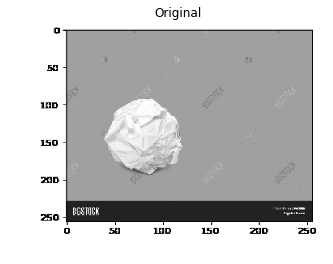

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


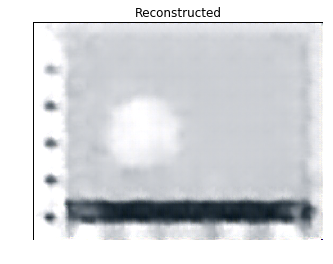

mse error:  405533.9912633837


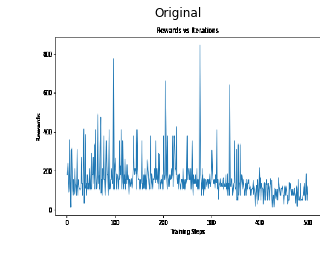

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


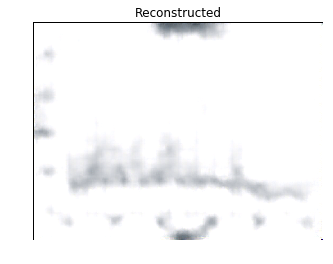

mse error:  611095.2810976943


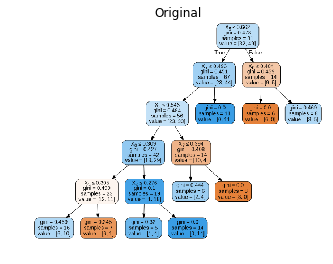

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


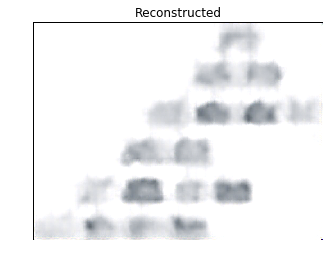

mse error:  580464.2842979747


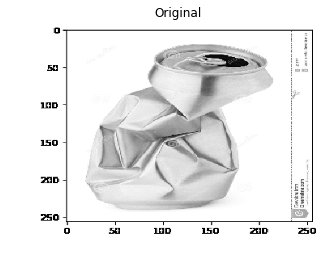

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


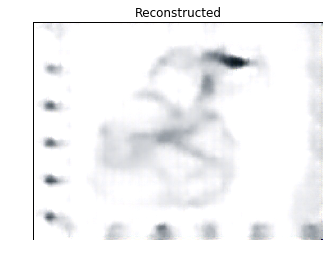

mse error:  571220.5891768298


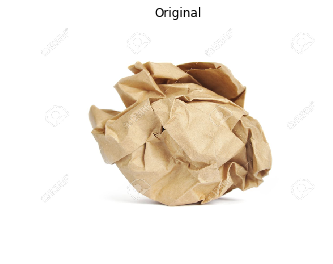

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


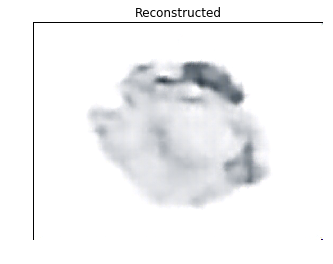

mse error:  582427.6199837631


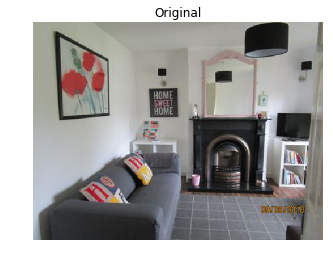

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


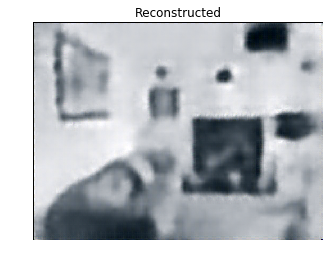

mse error:  287383.28605964157


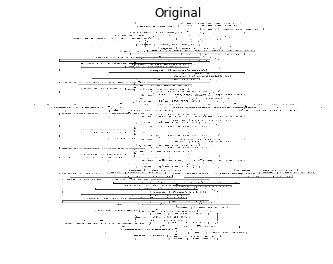

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


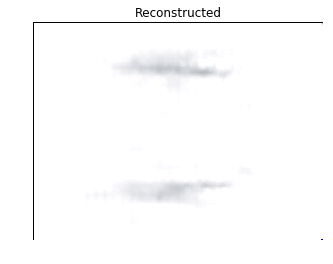

mse error:  629604.5923295605


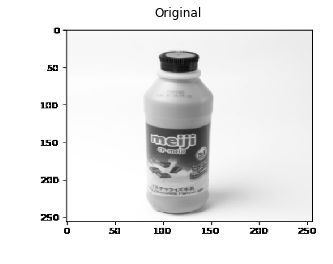

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


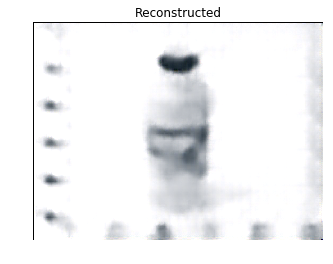

mse error:  561825.5987256299


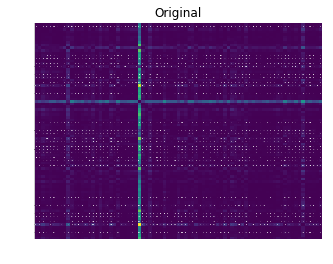

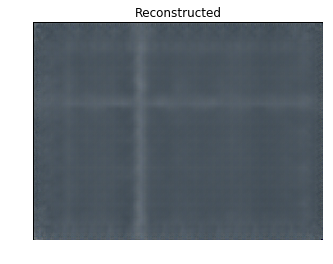

mse error:  67588.17757319707


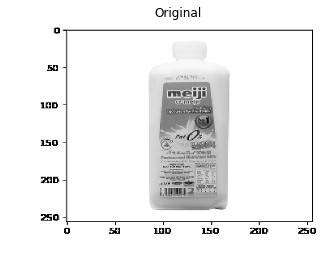

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


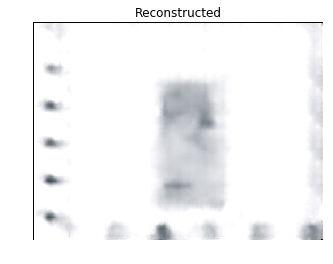

mse error:  586267.2405224461


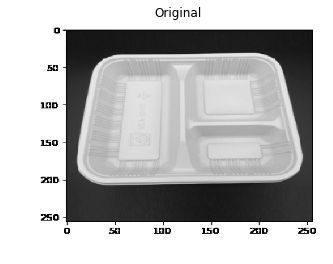

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


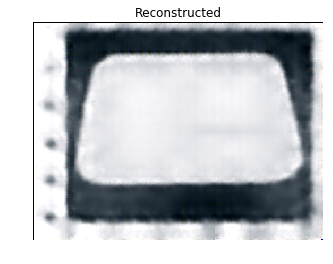

mse error:  340511.3387517633


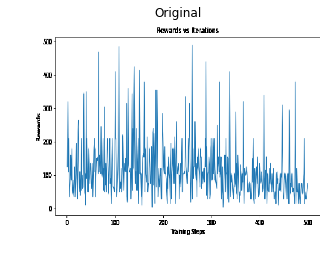

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


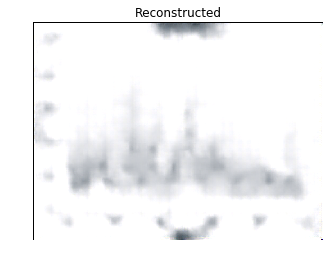

mse error:  580480.8056839058


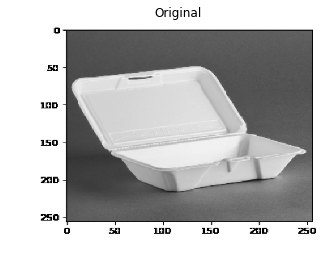

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


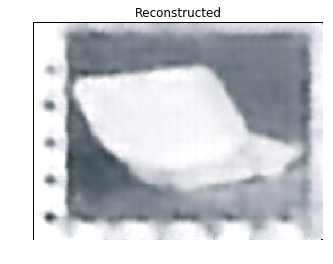

mse error:  355871.2762284078


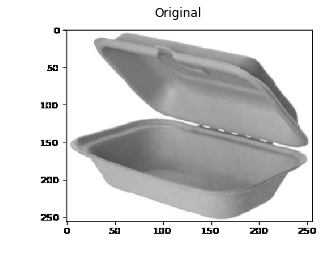

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


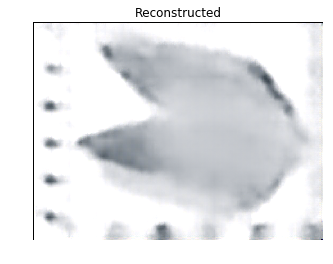

mse error:  490809.7960202315


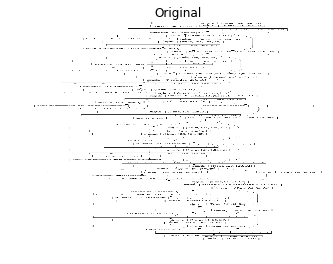

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


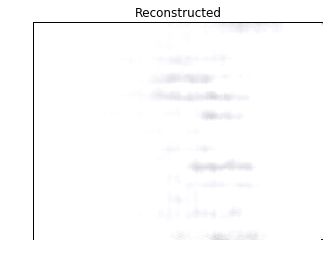

mse error:  629128.6126458349


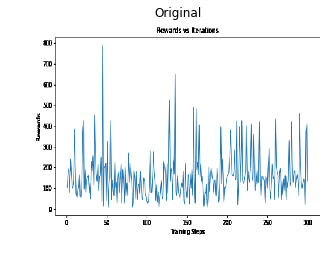

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


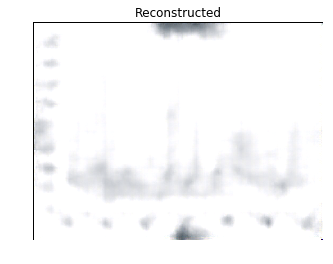

mse error:  607711.2595960356


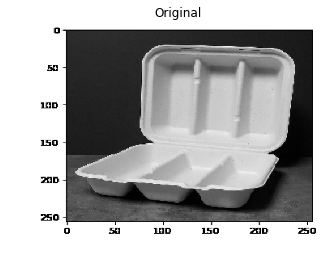

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


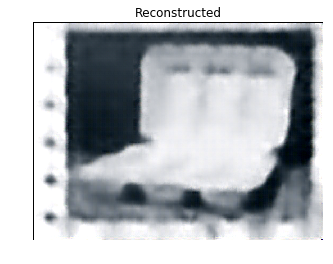

mse error:  298543.1414291421


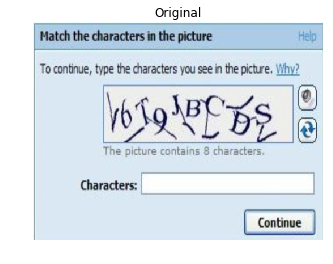

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


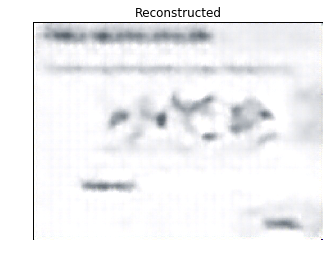

mse error:  535886.7339445665


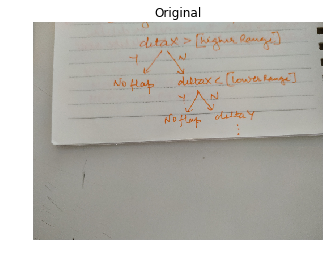

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


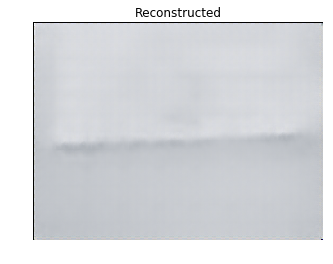

mse error:  392665.01431169576


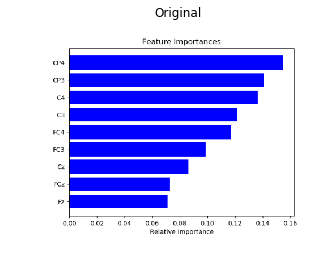

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


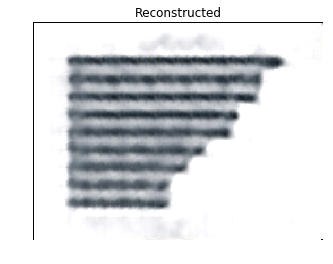

mse error:  462852.45965777285


In [32]:
false = decoder.predict(imgs)
for i in range(20):
  imgplt(imgs[i],'Original')
  imgplt(false[i],'Reconstructed')
  print('mse error: ',np.sum(np.square(img[i]-false[i])))

In [52]:
root_dir='test_images/false/'
imgs=[]
for item in os.walk(root_dir):
  files=item[2]  
  for i in files:
      if i.split('.')[-1]=='jpeg' or i.split('.')[-1]=='jpg' or i.split('.')[-1]=='png' or i.split('.')[-1]=='JPG': 
        try:
            im=cv2.imread(root_dir+i)
            im=cv2.resize(im,(512, 384))
            im=cv2.cvtColor(im,cv2.COLOR_BGR2RGB)
            imgs.append(im)
        except:
            continue
imgs = np.array(imgs)
imgs=imgs/255.

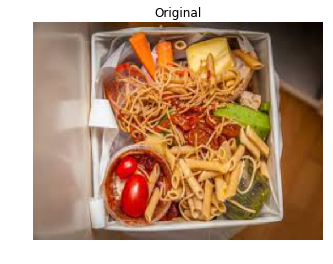

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


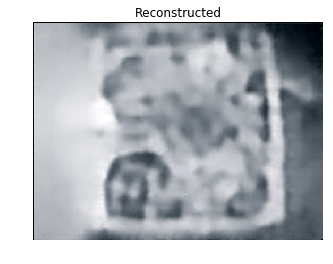

mse error:  255116.29352311185


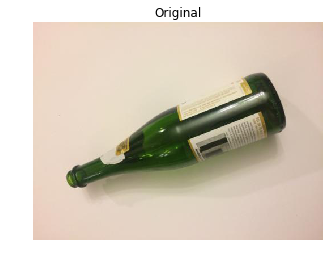

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


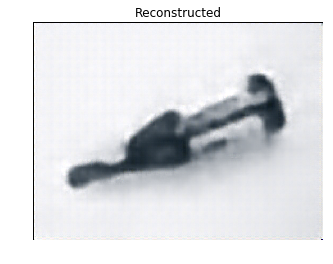

mse error:  449051.86168725754


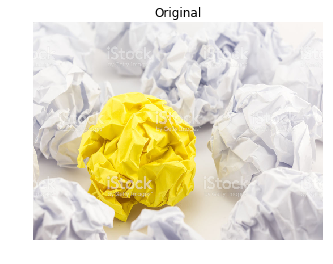

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


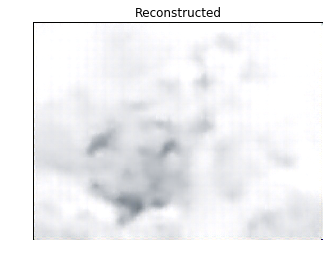

mse error:  525523.0390651111


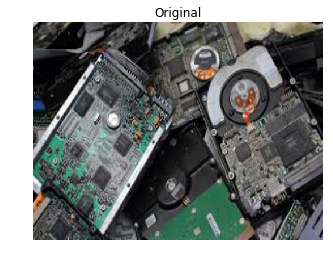

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


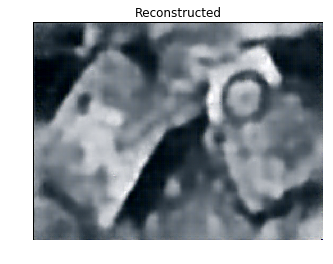

mse error:  138712.79474611612


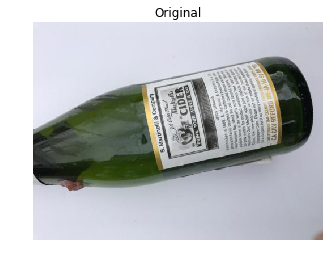

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


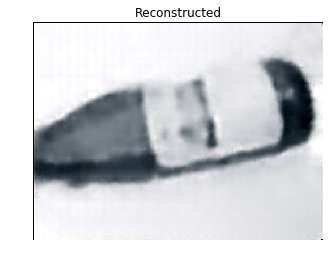

mse error:  399131.46273074124


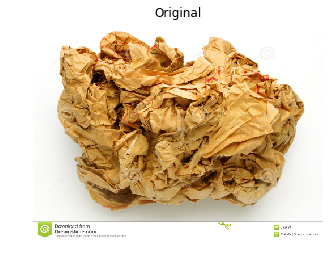

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


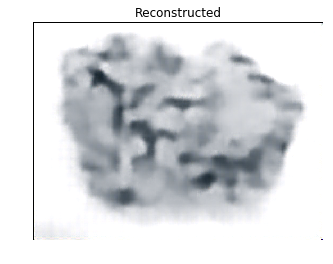

mse error:  435431.7685948596


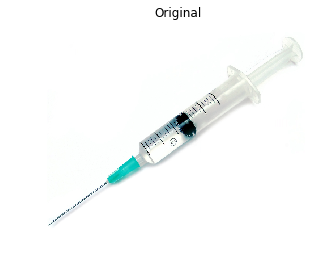

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


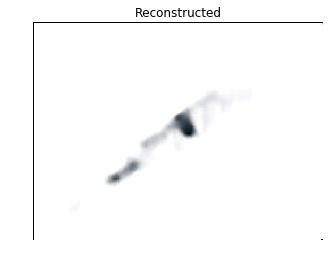

mse error:  647723.7045763351


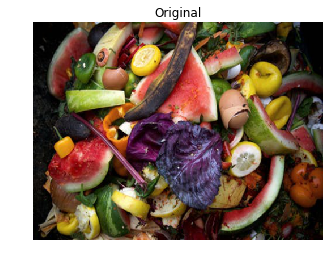

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


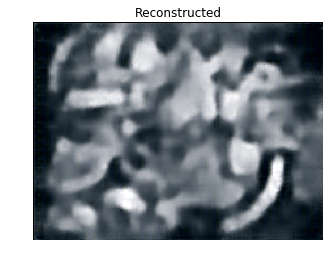

mse error:  126209.02193096743


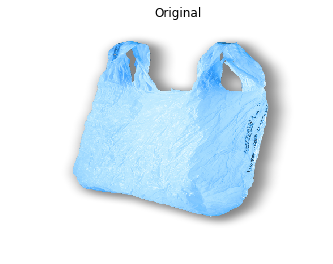

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


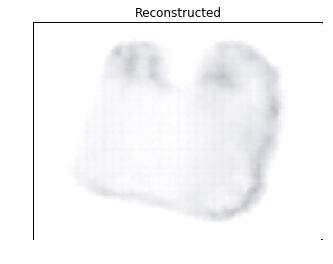

mse error:  592088.746953178


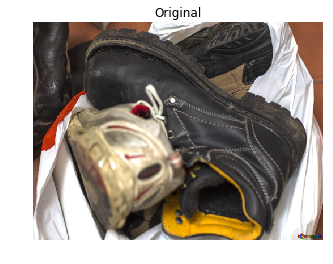

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


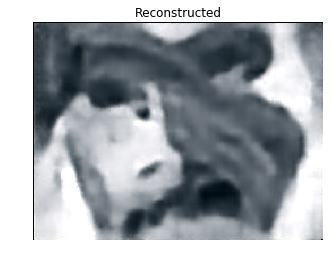

mse error:  215911.32658872008


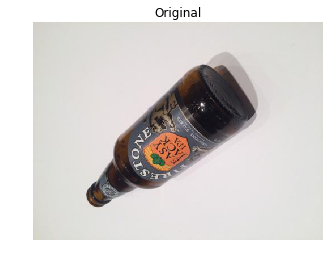

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


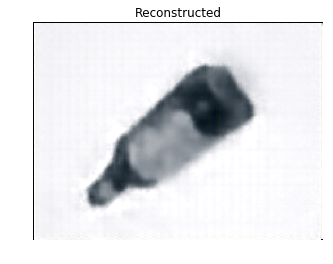

mse error:  483279.4627235775


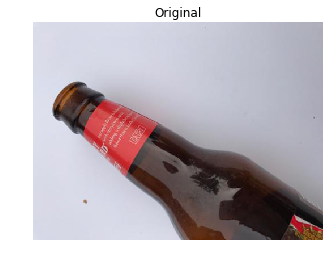

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


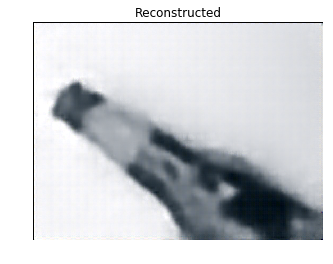

mse error:  385218.7169264625


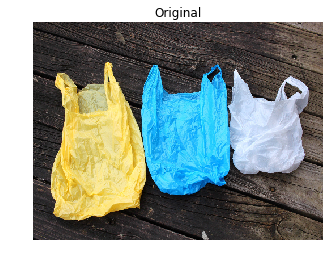

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


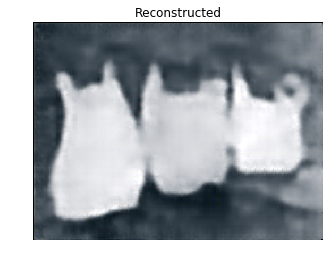

mse error:  217197.56940465572


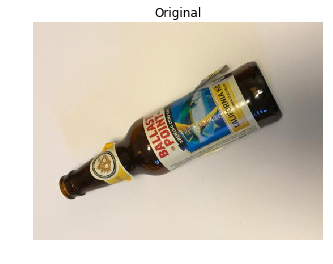

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


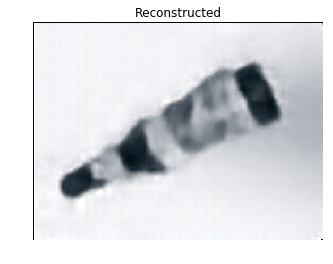

mse error:  434338.11623909796


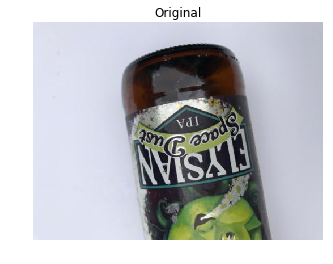

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


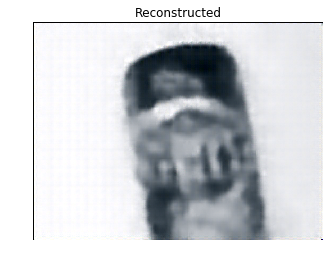

mse error:  389447.62667414016


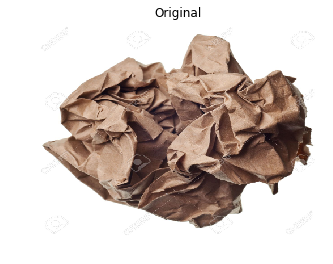

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


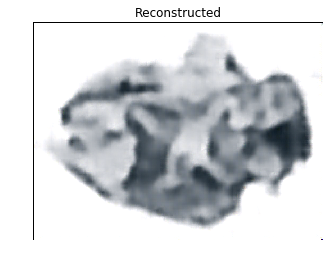

mse error:  431375.82134369446


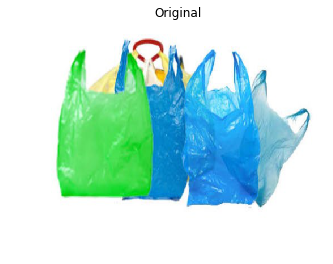

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


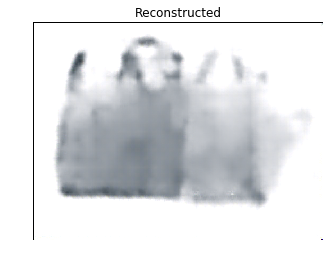

mse error:  492807.048033151


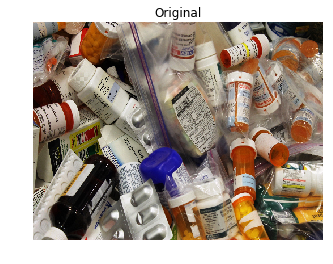

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


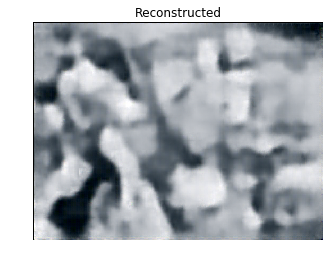

mse error:  240119.586415502


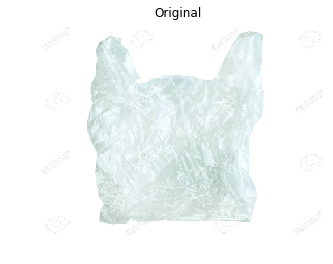

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


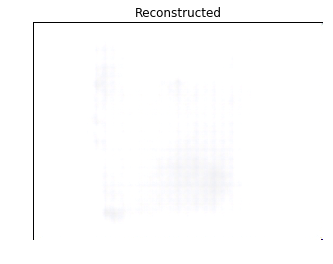

mse error:  630585.6638730953


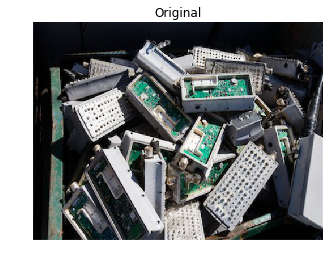

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


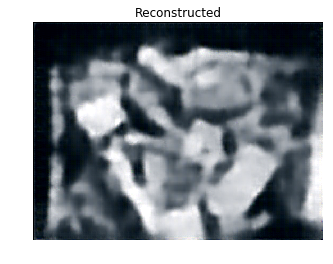

mse error:  148165.0634970722


In [54]:
false = decoder.predict(imgs)
for i in range(20):
  imgplt(imgs[i],'Original')
  imgplt(false[i],'Reconstructed')
  print('mse error: ',np.sum(np.square(img[i]-false[i])))

In [55]:
root_dir='test_images/true/'
imgs=[]
for item in os.walk(root_dir):
  files=item[2]  
  for i in files:
      if i.split('.')[-1]=='jpeg' or i.split('.')[-1]=='jpg' or i.split('.')[-1]=='png' or i.split('.')[-1]=='JPG': 
        try:
            im=cv2.imread(root_dir+i)
            im=cv2.resize(im,(512, 384))
            im=cv2.cvtColor(im,cv2.COLOR_BGR2RGB)
            imgs.append(im)
        except:
            continue
imgs = np.array(imgs)
imgs=imgs/255.

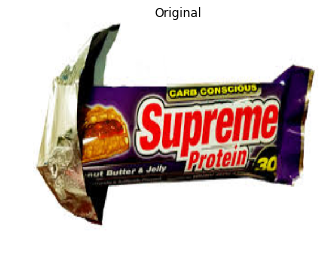

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


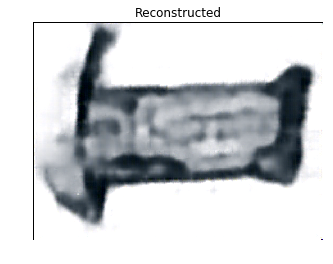

mse error:  423748.8324365054


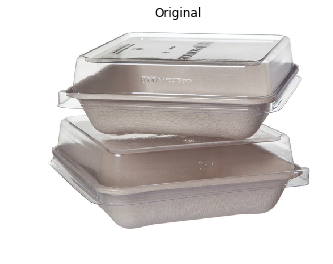

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


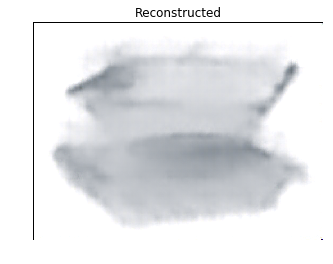

mse error:  493601.1741645385


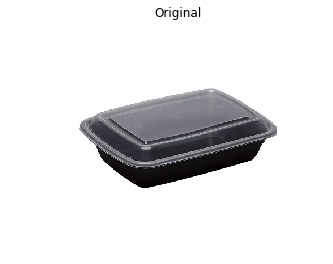

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


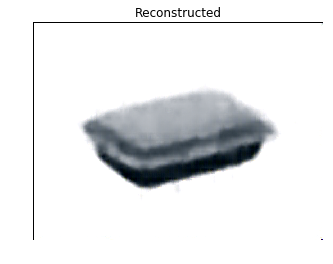

mse error:  560010.4312758879


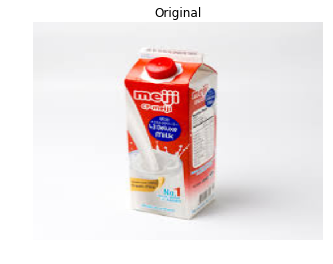

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


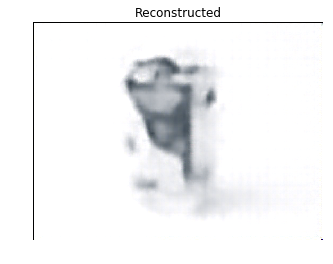

mse error:  563094.2240506158


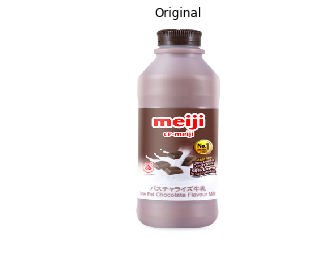

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


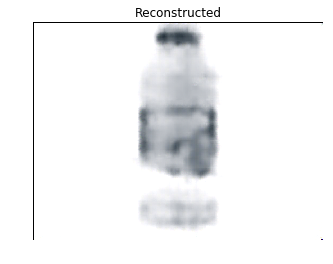

mse error:  594837.4580694125


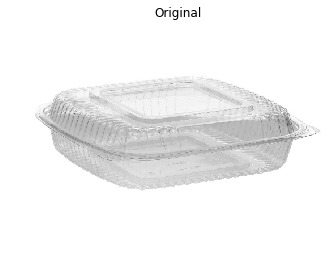

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


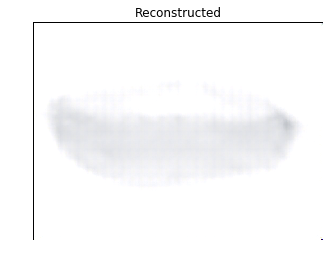

mse error:  614864.0631274635


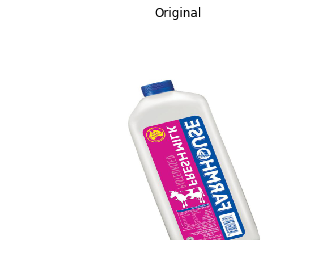

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


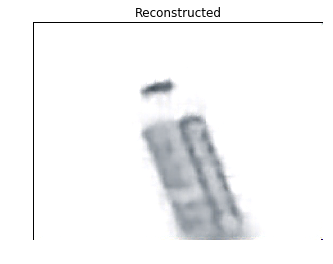

mse error:  603332.5500330688


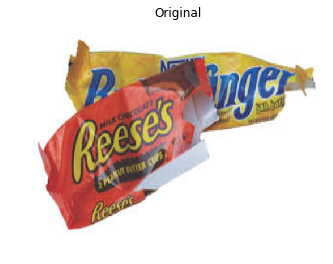

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


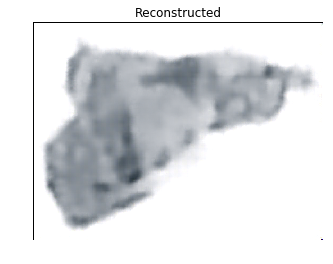

mse error:  483879.0097548319


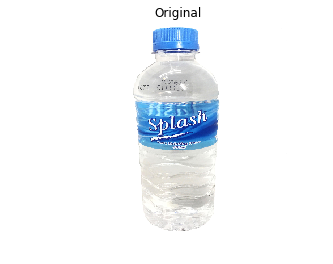

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


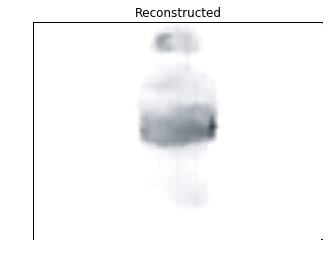

mse error:  622792.7114498713


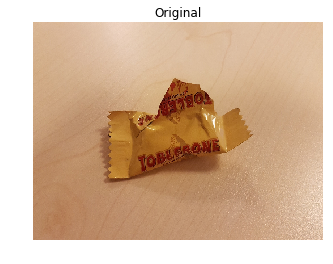

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


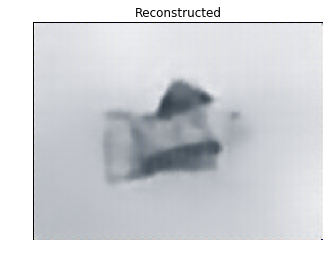

mse error:  377103.2830945038


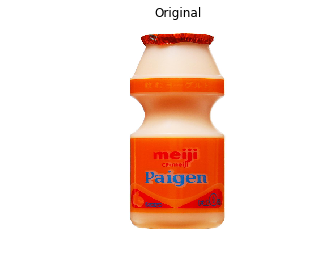

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


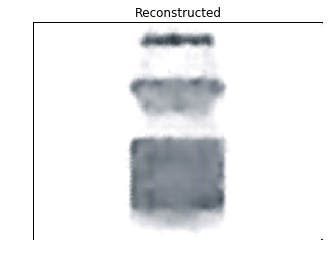

mse error:  561010.9056780572


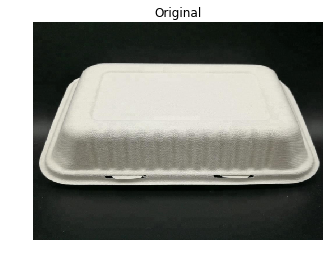

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


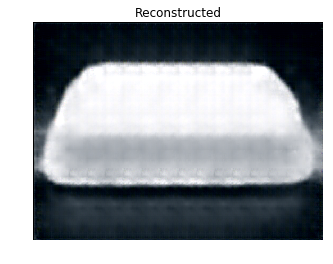

mse error:  218910.30856476835


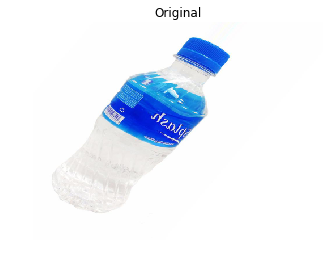

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


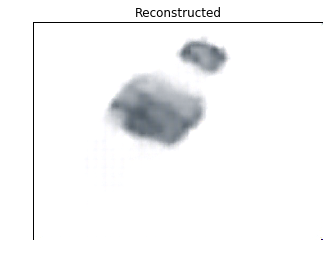

mse error:  612189.7989806061


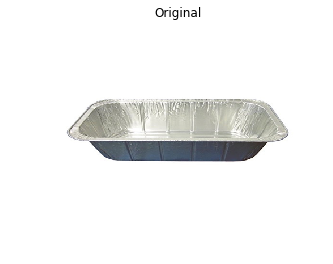

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


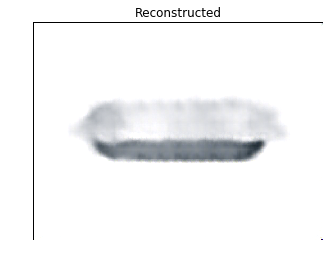

mse error:  611657.8214444184


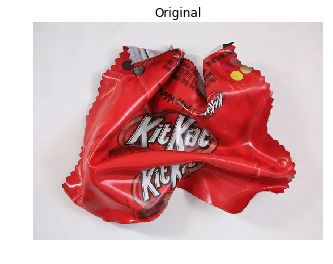

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


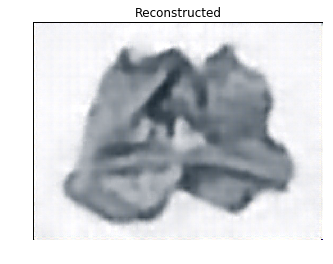

mse error:  371028.2031444409


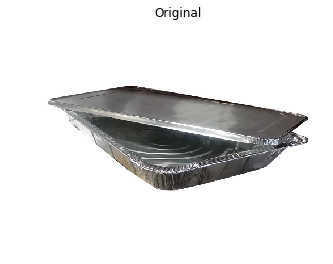

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


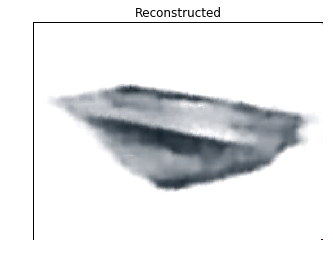

mse error:  539429.3442762762


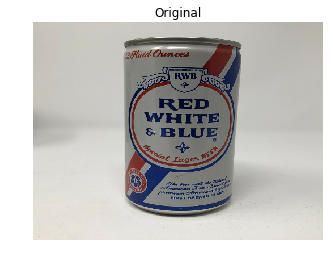

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


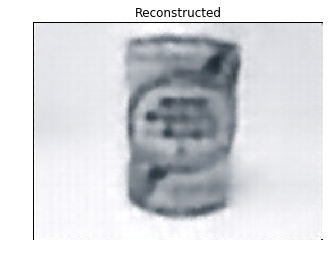

mse error:  406953.0198931216


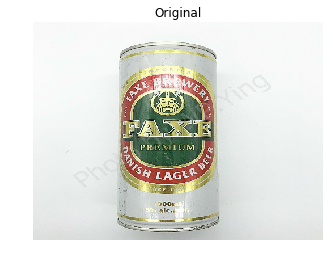

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


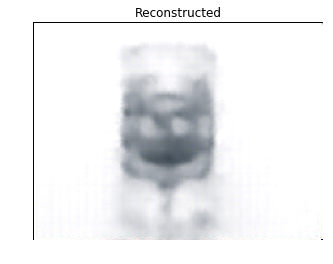

mse error:  536013.5756693946


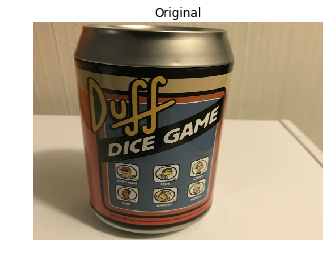

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


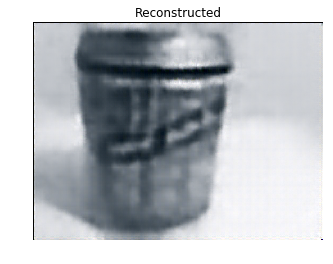

mse error:  289856.1445334574


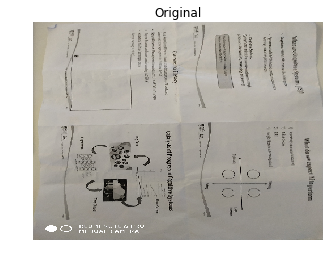

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


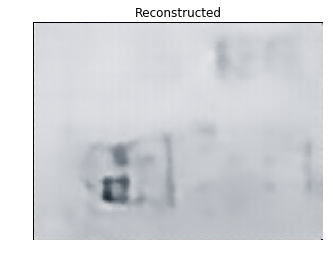

mse error:  384077.3255885359


In [56]:
true = decoder.predict(imgs)
for i in range(20):
  imgplt(imgs[i],'Original')
  imgplt(true[i],'Reconstructed')
  print('mse error: ',np.sum(np.square(img[i]-true[i])))